In [1]:
import pandas as pd
diabetes = pd.read_csv('diabetes.csv')
diabetes

,PatientID,Pregnancies,PlasmaGlucose,DiastolicBloodPressure,TricepsThickness,SerumInsulin,BMI,DiabetesPedigree,Age,Diabetic
0,1354778,0,171,80,34,23,43.509726,1.213191,21,0
1,1147438,8,92,93,47,36,21.240576,0.158365,23,0
2,1640031,7,115,47,52,35,41.511523,0.079019,23,0
3,1883350,9,103,78,25,304,29.582192,1.282870,43,1
4,1424119,1,85,59,27,35,42.604536,0.549542,22,0
...,...,...,...,...,...,...,...,...,...,...
14995,1490300,10,65,60,46,177,33.512468,0.148327,41,1
14996,1744410,2,73,66,27,168,30.132636,0.862252,38,1
14997,1742742,0,93,89,43,57,18.690683,0.427049,24,0
14998,1099353,0,132,98,18,161,19.791645,0.302257,23,0


In [2]:
features = ['Pregnancies','PlasmaGlucose','DiastolicBloodPressure','TricepsThickness','SerumInsulin','BMI','DiabetesPedigree','Age']
target = 'Diabetic'
X, y = diabetes[features], diabetes[target]
print('X:')
display(X)
print('\ny:')
display(y)

X:


,Pregnancies,PlasmaGlucose,DiastolicBloodPressure,TricepsThickness,SerumInsulin,BMI,DiabetesPedigree,Age
0,0,171,80,34,23,43.509726,1.213191,21
1,8,92,93,47,36,21.240576,0.158365,23
2,7,115,47,52,35,41.511523,0.079019,23
3,9,103,78,25,304,29.582192,1.282870,43
4,1,85,59,27,35,42.604536,0.549542,22
...,...,...,...,...,...,...,...,...
14995,10,65,60,46,177,33.512468,0.148327,41
14996,2,73,66,27,168,30.132636,0.862252,38
14997,0,93,89,43,57,18.690683,0.427049,24
14998,0,132,98,18,161,19.791645,0.302257,23



y:


0        0
1        0
2        0
3        1
4        0
        ..
14995    1
14996    1
14997    0
14998    0
14999    1
Name: Diabetic, Length: 15000, dtype: int64

In [3]:
pd.Series(y).value_counts(normalize=True)

Diabetic
0    0.666667
1    0.333333
Name: proportion, dtype: float64

In [4]:
diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   PatientID               15000 non-null  int64  
 1   Pregnancies             15000 non-null  int64  
 2   PlasmaGlucose           15000 non-null  int64  
 3   DiastolicBloodPressure  15000 non-null  int64  
 4   TricepsThickness        15000 non-null  int64  
 5   SerumInsulin            15000 non-null  int64  
 6   BMI                     15000 non-null  float64
 7   DiabetesPedigree        15000 non-null  float64
 8   Age                     15000 non-null  int64  
 9   Diabetic                15000 non-null  int64  
dtypes: float64(2), int64(8)
memory usage: 1.1 MB


In [5]:
X.describe()

,Pregnancies,PlasmaGlucose,DiastolicBloodPressure,TricepsThickness,SerumInsulin,BMI,DiabetesPedigree,Age
count,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000
mean,3.224533,107.856867,71.220667,28.814000,137.852133,31.509646,0.398968,30.137733
std,3.391020,31.981975,16.758716,14.555716,133.068252,9.759000,0.377944,12.089703
min,0.000000,44.000000,24.000000,7.000000,14.000000,18.200512,0.078044,21.000000
25%,0.000000,84.000000,58.000000,15.000000,39.000000,21.259887,0.137743,22.000000
50%,2.000000,104.000000,72.000000,31.000000,83.000000,31.767940,0.200297,24.000000
75%,6.000000,129.000000,85.000000,41.000000,195.000000,39.259692,0.616285,35.000000
max,14.000000,192.000000,117.000000,93.000000,799.000000,56.034628,2.301594,77.000000


Unique values: 15


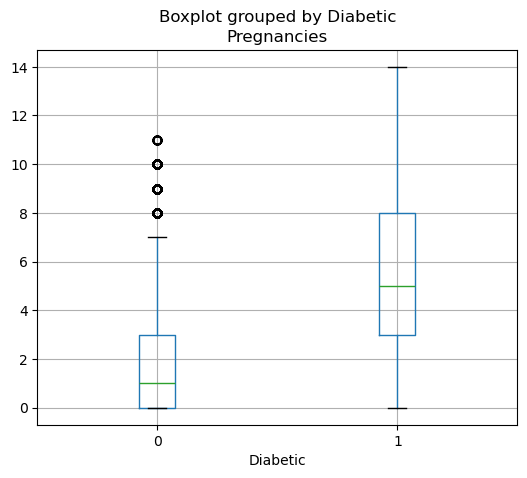

Unique values: 149


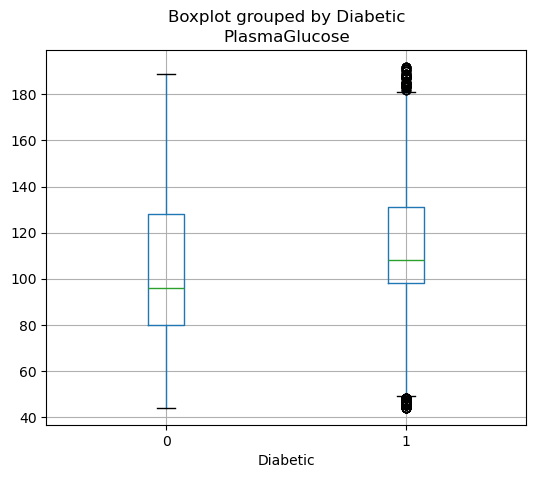

Unique values: 90


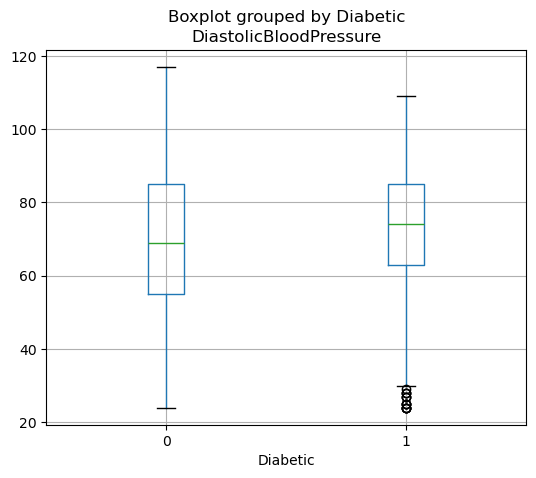

Unique values: 69


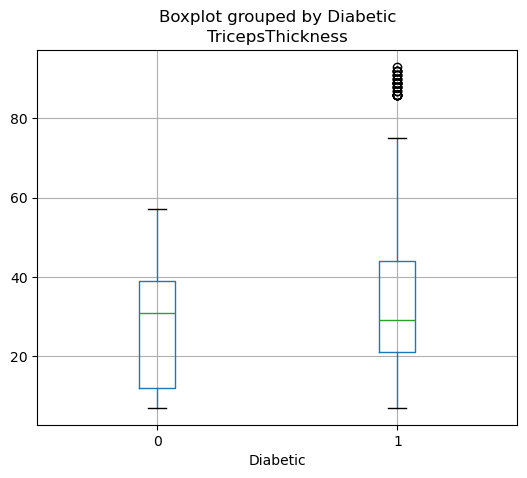

Unique values: 663


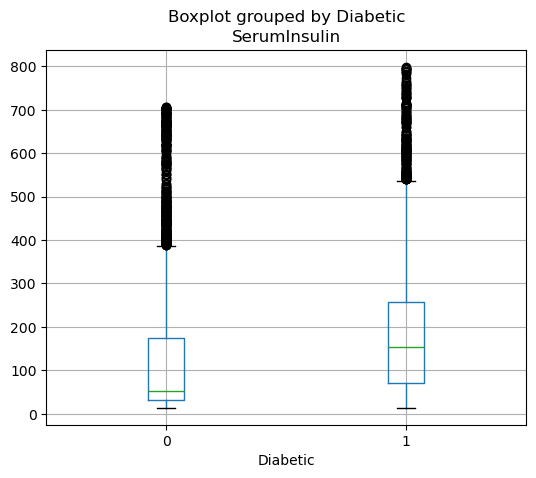

Unique values: 15000


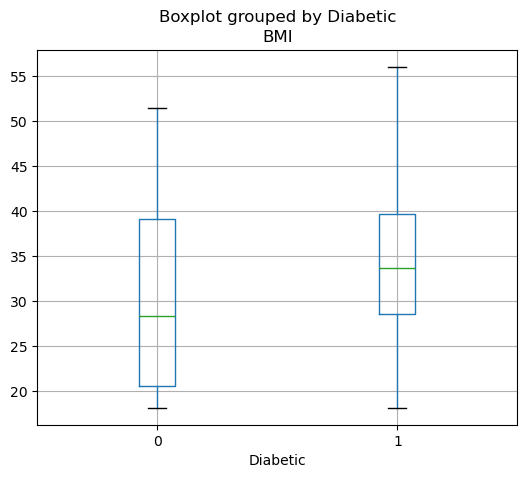

Unique values: 14999


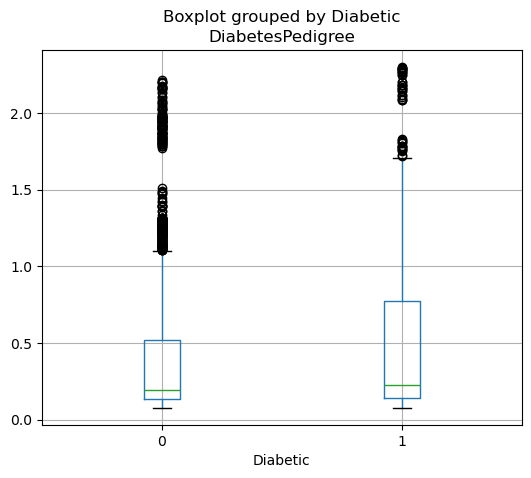

Unique values: 56


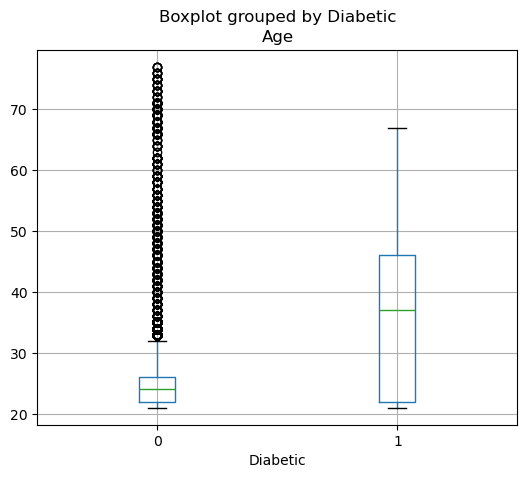

In [6]:
import matplotlib.pyplot as plt
for col in features:
    print(f'Unique values: {len(diabetes[col].unique())}')
    diabetes.boxplot(column=col, by='Diabetic', figsize=(6,5))
    plt.title(col)
    plt.show()

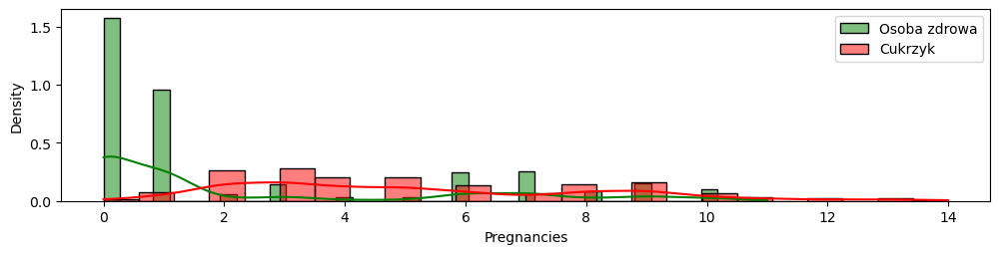

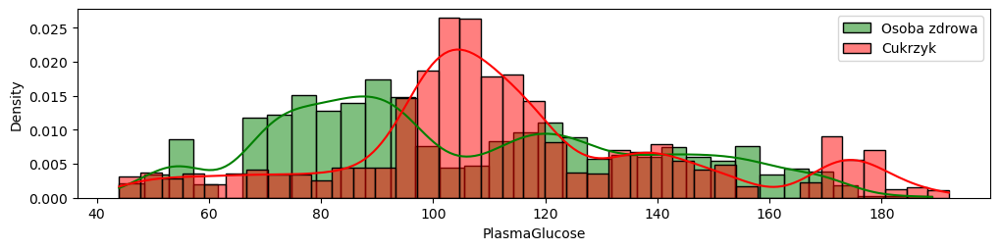

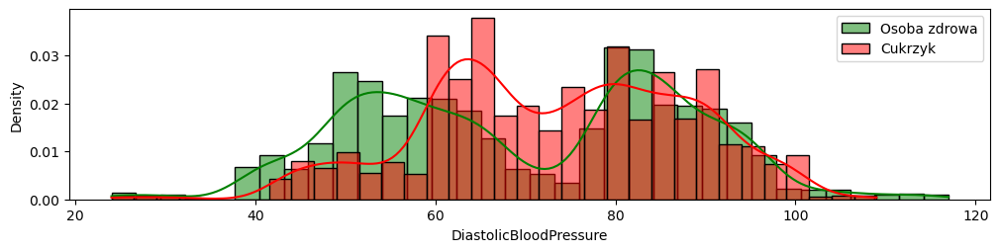

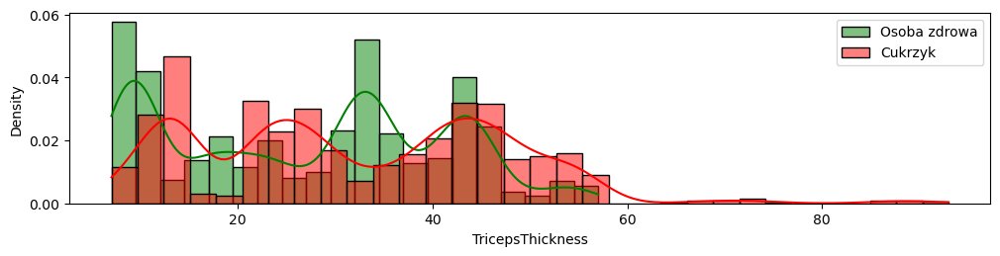

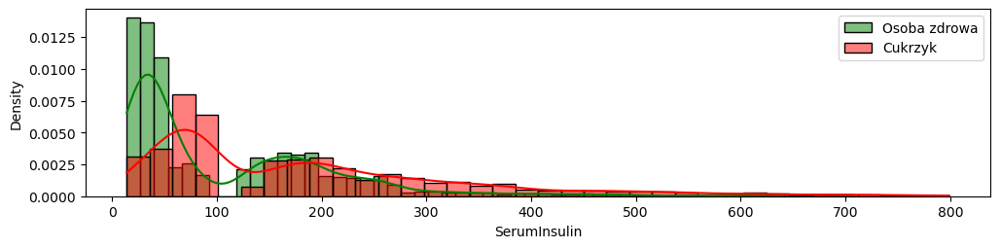

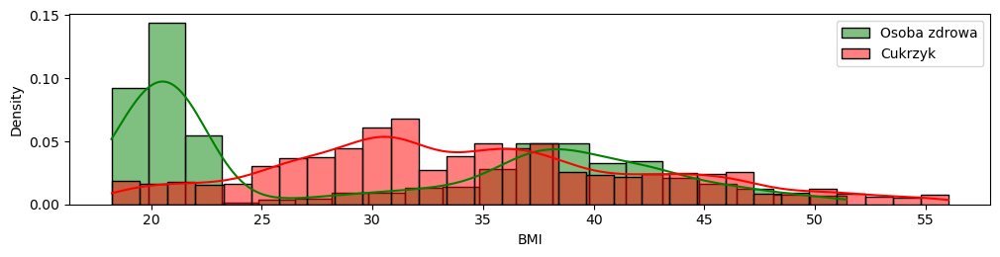

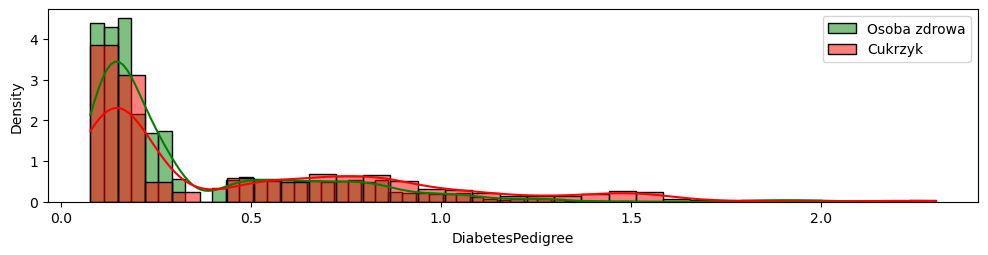

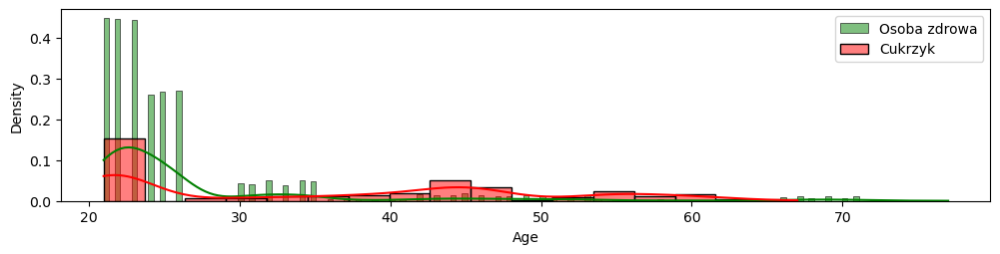

In [7]:
import seaborn as sns
for col in features:
    plt.figure(figsize=(12, 2.5))
    sns.histplot(
        data=diabetes.loc[diabetes['Diabetic'] == 0, col],
        kde=True,
        stat='density',
        color='green',
        label='Osoba zdrowa'
    )
    sns.histplot(
        data=diabetes.loc[diabetes['Diabetic'] == 1, col],
        kde=True,
        stat='density',
        color='red',
        label='Cukrzyk'
    )
    plt.legend(loc='upper right')
    plt.show()

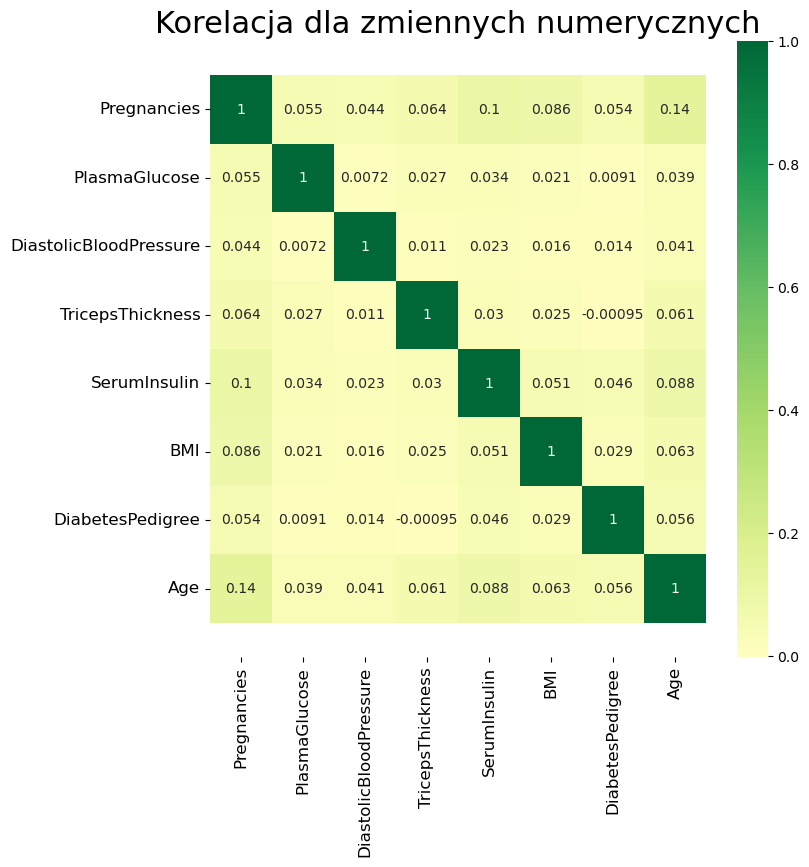

In [8]:
plt.figure(figsize=(8, 8))
ax = sns.heatmap(X.corr(),
                 xticklabels=X.corr().columns,
                 yticklabels=X.corr().columns,
                 cmap='RdYlGn',
                 center=0,
                 annot=True)

plt.title('Korelacja dla zmiennych numerycznych', fontsize=22)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

In [9]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X[['Pregnancies', 'Age']], y, test_size=0.30, random_state=0, stratify=y)
print ('Treningowe obserwacje: %d\nTestowe obserwacje: %d' % (X_train.shape[0], X_test.shape[0]))

Treningowe obserwacje: 10500
Testowe obserwacje: 4500


In [10]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

scaler_2var = StandardScaler()
X_train_standardized = scaler_2var.fit_transform(X_train)
X_test_standardized = scaler_2var.transform(X_test)
model_lr = LogisticRegression()
model_lr.fit(X_train_standardized, y_train)

LogisticRegression()

C:\Users\Urban\AppData\Local\Temp\ipykernel_16704\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


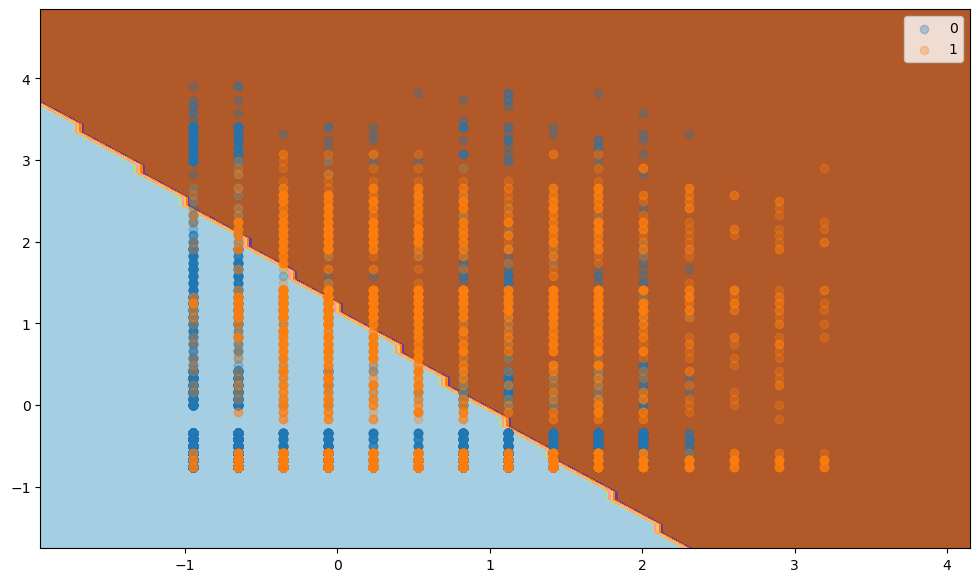

In [11]:
from numpy import where
from numpy import meshgrid
from numpy import arange
from numpy import hstack

def plot_classification_surface(X_plot, y_plot, trained_model):
    plt.figure(figsize=(12, 7))

    # określenie granic zbioru
    min1, max1 = X_plot[:, 0].min()-1, X_plot[:, 0].max()+1
    min2, max2 = X_plot[:, 1].min()-1, X_plot[:, 1].max()+1

    # skalowanie dla obu osi
    x1grid = arange(min1, max1, 0.1)
    x2grid = arange(min2, max2, 0.1)

    # utworzenie siatki
    xx, yy = meshgrid(x1grid, x2grid)

    # przetworzenie siatki w wektor
    r1, r2 = xx.flatten(), yy.flatten()
    r1, r2 = r1.reshape((len(r1), 1)), r2.reshape((len(r2), 1))

    # stworzenie zmiennych objaśniających dla modelu
    grid = hstack((r1,r2))

    # predykcja modelu zbioru
    yhat = trained_model.predict(grid)

    # przetworzenie predykcji na decyzji dla konkretnego punktu wykresu
    zz = yhat.reshape(xx.shape)

    # wizualizacja siatki z przyporządkowaną klasą
    plt.contourf(xx, yy, zz, cmap='Paired')

    # tworzenie wykresu punktowego dla klas ze zbioru X
    for class_value in range(2):

        # przyporządkowanie klasy (y) do obsewacji (X)
        row_ix = where(y_plot == class_value)

        # stworzenie wykresu punktowego
        plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)

    # wizualizacja wykresu
    plt.legend(loc='upper right')
    plt.show()

plot_classification_surface(X_plot=X_train_standardized, y_plot=y_train, trained_model=model_lr)

In [12]:
predictions_lr = model_lr.predict(X_test_standardized)
print('Predicted labels: ', predictions_lr[:5], predictions_lr[-5:])
print('Actual labels:    ' , y_test[:5].values, y_test[-5:].values)

Predicted labels:  [0 0 1 0 0] [1 0 1 0 0]
Actual labels:     [0 1 0 0 0] [1 1 0 0 0]


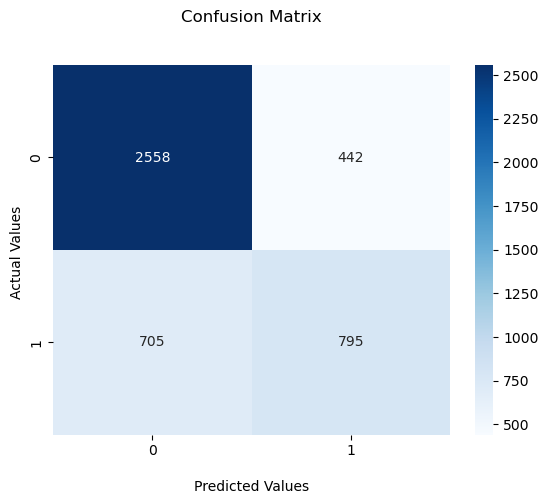

In [13]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(y_test, predictions_lr)
ax = sns.heatmap(cm, annot=True, cmap='Blues', fmt='.0f')
ax.set_title('Confusion Matrix\n\n')
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ')
plt.show()

In [14]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

print('Accuracy: ', accuracy_score(y_test, predictions_lr))
print("Precision:", precision_score(y_test, predictions_lr))
print("Recall:", recall_score(y_test, predictions_lr))
print("F1_score:", f1_score(y_test, predictions_lr))

Accuracy:  0.7451111111111111
Precision: 0.6426839126919968
Recall: 0.53
F1_score: 0.5809280233832663


In [15]:
from sklearn.metrics import classification_report

print(classification_report(y_test, predictions_lr))

              precision    recall  f1-score   support

           0       0.78      0.85      0.82      3000
           1       0.64      0.53      0.58      1500

    accuracy                           0.75      4500
   macro avg       0.71      0.69      0.70      4500
weighted avg       0.74      0.75      0.74      4500



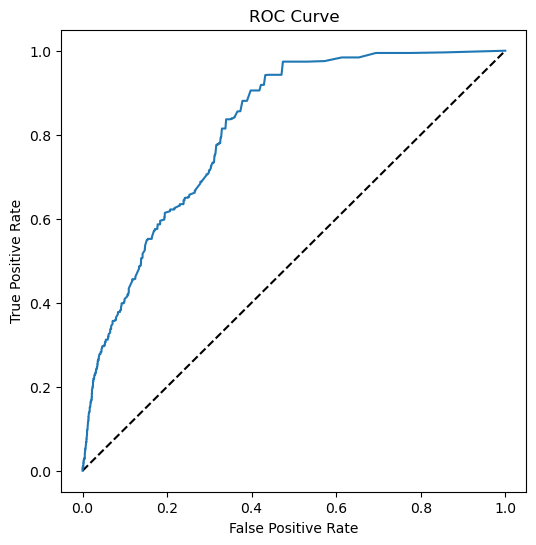

AUC: 0.8164931111111111


In [16]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

# prognoza prawdopodobieństwa
predictions_probability_lr = model_lr.predict_proba(X_test_standardized)

# obliczenie FPR oraz TPR w zależności od punktu odcięcia
fpr, tpr, thresholds = roc_curve(y_test, predictions_probability_lr[:,1])

# wizualizacja ROC Curve
fig = plt.figure(figsize=(6, 6))

# rysowanie prostej dla modelu losowego
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

# obliczenie AUC
auc = roc_auc_score(y_test, predictions_probability_lr[:,1])
print('AUC: ' + str(auc))

In [17]:
metrics_dataframe = pd.DataFrame(columns = ['Model', 'F1_score', 'AUC'])
metrics_dataframe
models = []
models_names = []
predictions_proba_list = []
def calculate_metrics(model, name, X_checked, y_checked):
    models.append(model)
    models_names.append(name)
    global metrics_dataframe
    predictions = model.predict(X_checked)
    predictions_proba = model.predict_proba(X_checked)
    predictions_proba_list.append(predictions_proba[:,1])

    ############## metryki dla sprawdzanego modelu ################
    # Precision, Recall, F1, Accuracy
    print(classification_report(y_checked, predictions))

    # Confusion matrix
    plt.figure()
    cm = confusion_matrix(y_checked, predictions)
    ax = sns.heatmap(cm, annot=True, cmap='Blues', fmt='.0f')
    ax.set_title('Confusion Matrix\n\n')
    ax.set_xlabel('\nPredicted Values')
    ax.set_ylabel('Actual Values ')
    plt.show()

    # plot ROC curve
    fig = plt.figure(figsize=(6, 6))
    plt.plot([0, 1], [0, 1], 'k--')
    for model_selected, name_selected, pred_proba in zip(models, models_names, predictions_proba_list):
        fpr, tpr, thresholds = roc_curve(y_checked, pred_proba)
        plt.plot(fpr, tpr, label=name_selected)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc='lower right')
    plt.show()

    f1_metric = f1_score(y_checked, predictions)
    auc_metric = roc_auc_score(y_checked, predictions_proba[:,1])
    new_row = pd.DataFrame({'Model': [name], 'F1_score': [f1_metric], 'AUC': [auc_metric]})
    if metrics_dataframe.empty:
        metrics_dataframe = new_row
    else:
        metrics_dataframe = pd.concat([metrics_dataframe, new_row], ignore_index=True)
    return metrics_dataframe

              precision    recall  f1-score   support

           0       0.78      0.85      0.82      3000
           1       0.64      0.53      0.58      1500

    accuracy                           0.75      4500
   macro avg       0.71      0.69      0.70      4500
weighted avg       0.74      0.75      0.74      4500



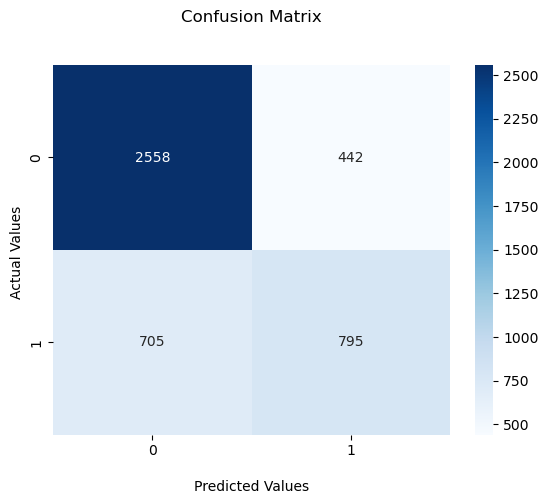

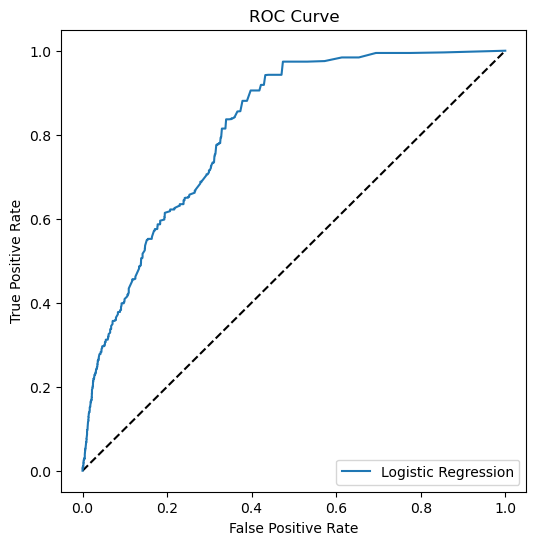

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493


In [18]:
calculate_metrics(model_lr, 'Logistic Regression', X_test_standardized, y_test)


C:\Users\Urban\AppData\Local\Temp\ipykernel_16704\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


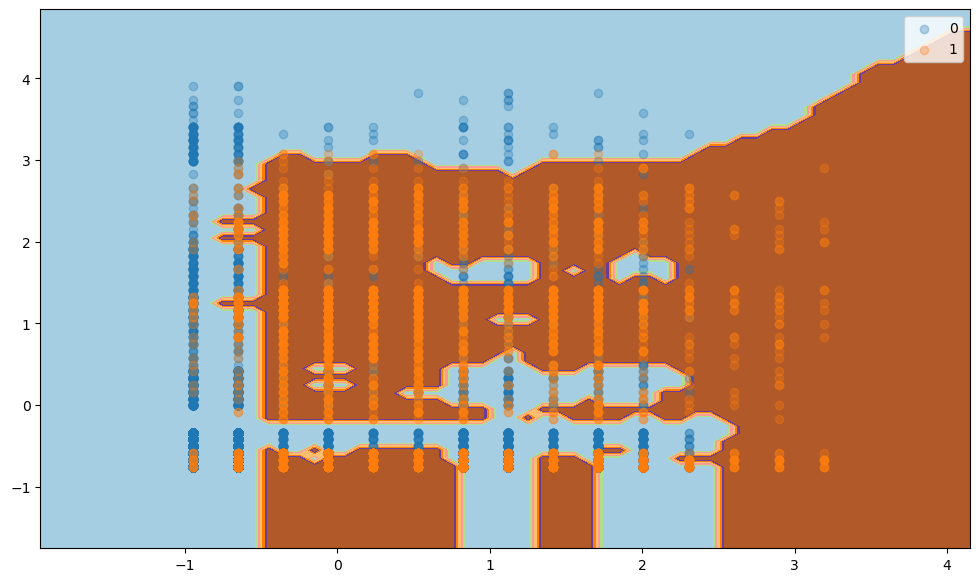

In [19]:
from sklearn.neighbors import KNeighborsClassifier

model_knn = KNeighborsClassifier(n_neighbors= int(X_train_standardized.shape[0]*0.001))
model_knn.fit(X_train_standardized, y_train)
plot_classification_surface(X_plot=X_train_standardized, y_plot=y_train, trained_model=model_knn)

              precision    recall  f1-score   support

           0       0.90      0.91      0.91      3000
           1       0.81      0.80      0.81      1500

    accuracy                           0.87      4500
   macro avg       0.86      0.86      0.86      4500
weighted avg       0.87      0.87      0.87      4500



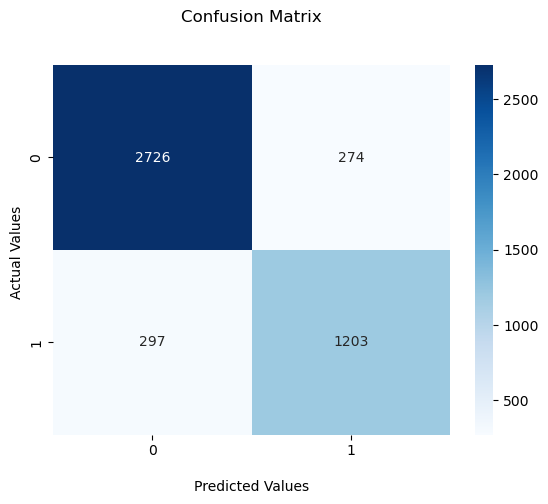

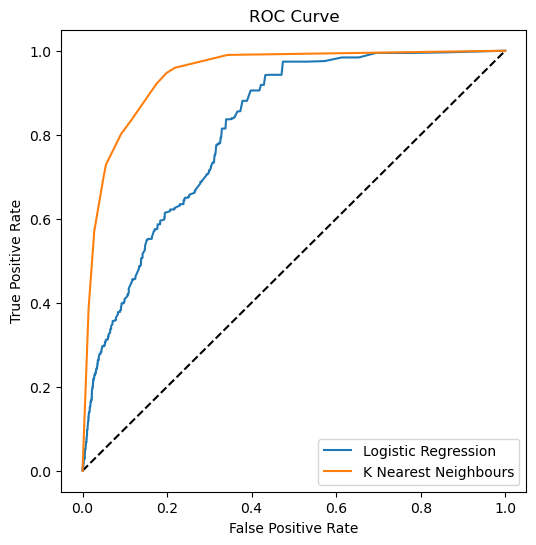

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,K Nearest Neighbours,0.808196,0.942804


In [20]:
calculate_metrics(model_knn, 'K Nearest Neighbours', X_test_standardized, y_test)

C:\Users\Urban\AppData\Local\Temp\ipykernel_16704\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_plot[row_ix, 0], X_plot[row_ix, 1], cmap='Paired', alpha=0.3, label=class_value)


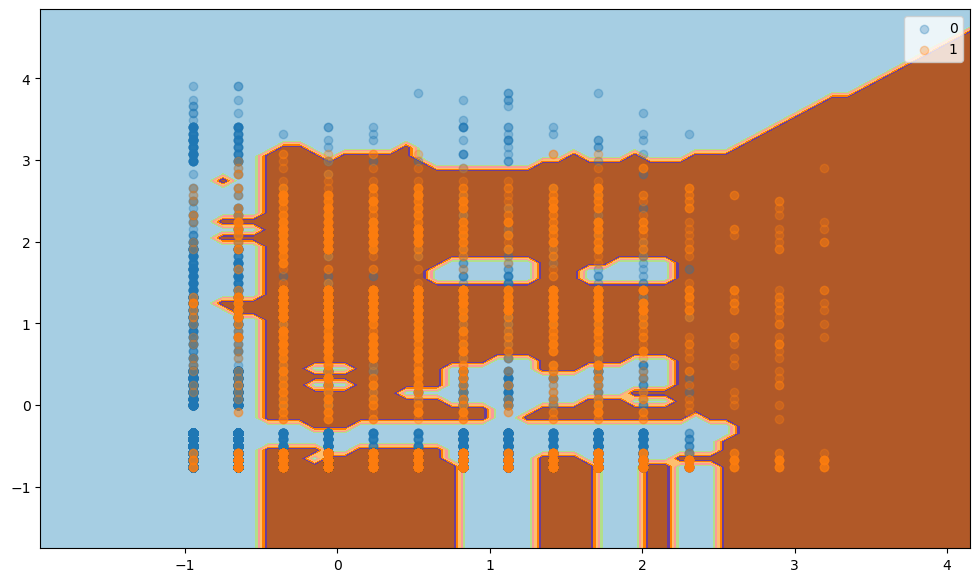

In [21]:
from sklearn.neighbors import KNeighborsClassifier

model_knn_best = KNeighborsClassifier(n_neighbors=7, metric='euclidean', p=2)
model_knn_best.fit(X_train_standardized, y_train)
plot_classification_surface(X_plot=X_train_standardized, y_plot=y_train, trained_model=model_knn_best)

              precision    recall  f1-score   support

           0       0.91      0.91      0.91      3000
           1       0.81      0.82      0.82      1500

    accuracy                           0.88      4500
   macro avg       0.86      0.86      0.86      4500
weighted avg       0.88      0.88      0.88      4500



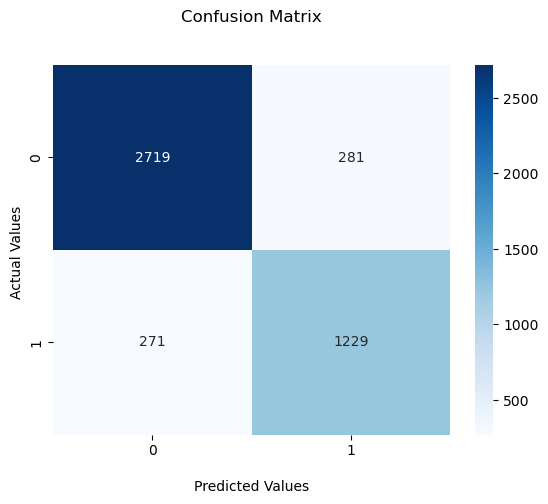

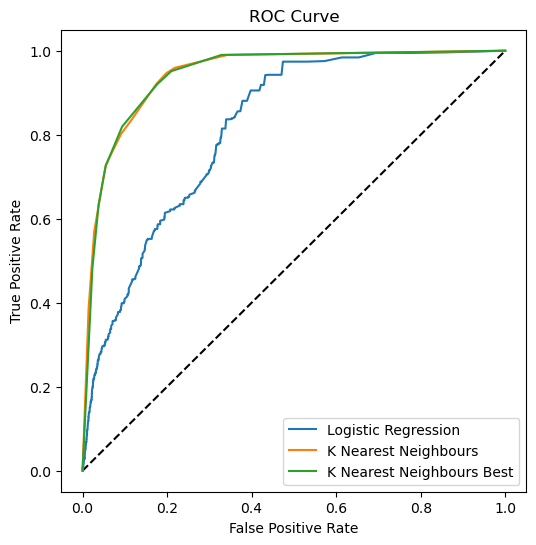

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,K Nearest Neighbours,0.808196,0.942804
2,K Nearest Neighbours Best,0.816611,0.941814


In [22]:
calculate_metrics(model_knn_best, 'K Nearest Neighbours Best', X_test_standardized, y_test)

In [23]:
from sklearn.tree import DecisionTreeClassifier

model_tree = DecisionTreeClassifier(max_depth=3, min_samples_leaf=int(X_train.shape[0]*0.001))
model_tree.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3, min_samples_leaf=10)

In [24]:
import dtreeviz
print(dtreeviz.__version__)

2.2.2


c:\Users\Urban\.conda\envs\kodilla-edu\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


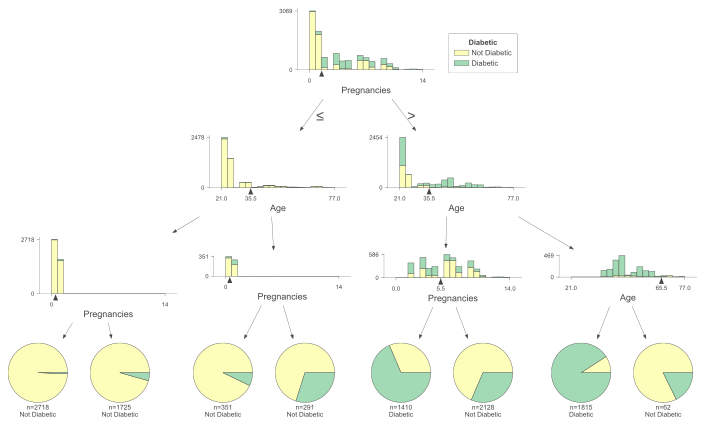

In [25]:
from dtreeviz import model  # <-- newer API

viz_model = model(
    model_tree,                   # your trained decision tree model
    X_train,
    y_train,
    feature_names=list(X_train.columns),
    target_name="Diabetic",
    class_names=["Not Diabetic", "Diabetic"]  # for classification
)

viz_model.view()

c:\Users\Urban\.conda\envs\kodilla-edu\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
C:\Users\Urban\AppData\Local\Temp\ipykernel_16704\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


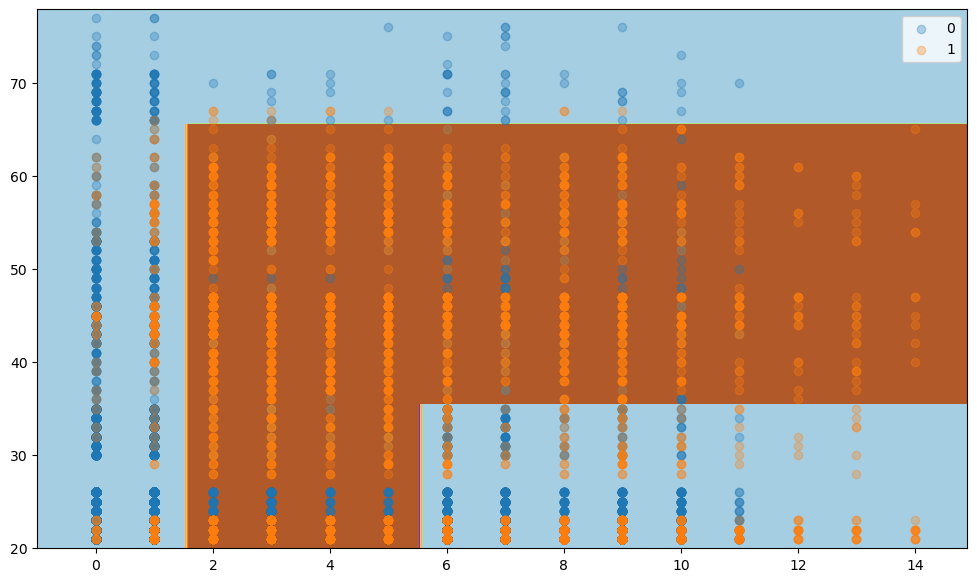

In [26]:
import numpy as np

plot_classification_surface(X_plot=np.array(X_train), y_plot=y_train, trained_model=model_tree)

              precision    recall  f1-score   support

           0       0.88      0.91      0.89      3000
           1       0.80      0.76      0.78      1500

    accuracy                           0.86      4500
   macro avg       0.84      0.83      0.84      4500
weighted avg       0.86      0.86      0.86      4500



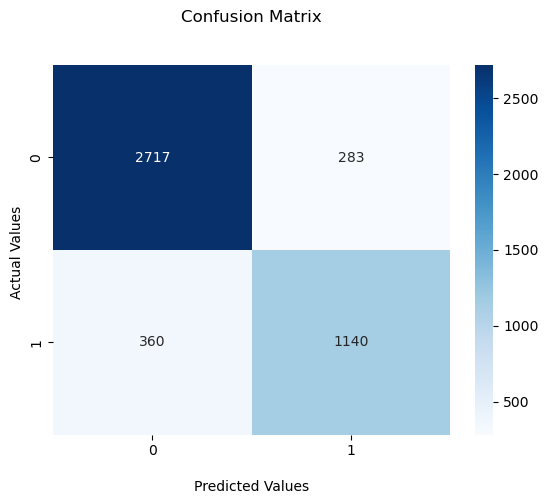

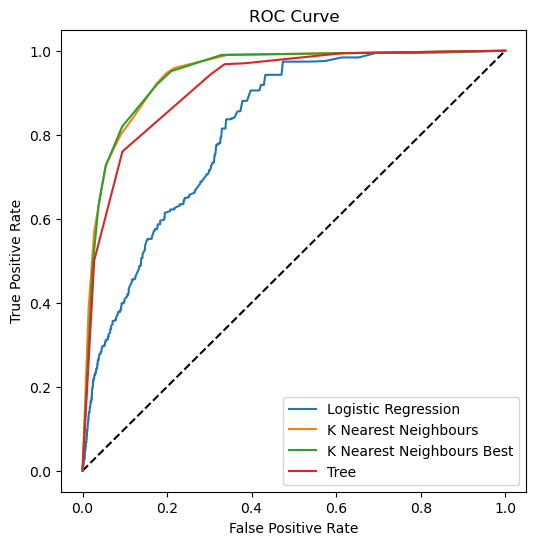

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,K Nearest Neighbours,0.808196,0.942804
2,K Nearest Neighbours Best,0.816611,0.941814
3,Tree,0.780021,0.915466


In [27]:
calculate_metrics(model_tree, 'Tree', X_test, y_test)

In [28]:
from sklearn.tree import DecisionTreeClassifier

model_tree_best = DecisionTreeClassifier(max_depth=None, min_samples_leaf=10)
model_tree_best.fit(X_train, y_train)

DecisionTreeClassifier(min_samples_leaf=10)

In [29]:
from dtreeviz import model  # <-- newer API

viz_model = model(
    model_tree_best,                   # your trained decision tree model
    X_train,
    y_train,
    feature_names=list(X_train.columns),
    target_name="Diabetic",
    class_names=["Not Diabetic", "Diabetic"]  # for classification
)

viz_model.view()

c:\Users\Urban\.conda\envs\kodilla-edu\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


c:\Users\Urban\.conda\envs\kodilla-edu\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
C:\Users\Urban\AppData\Local\Temp\ipykernel_16704\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


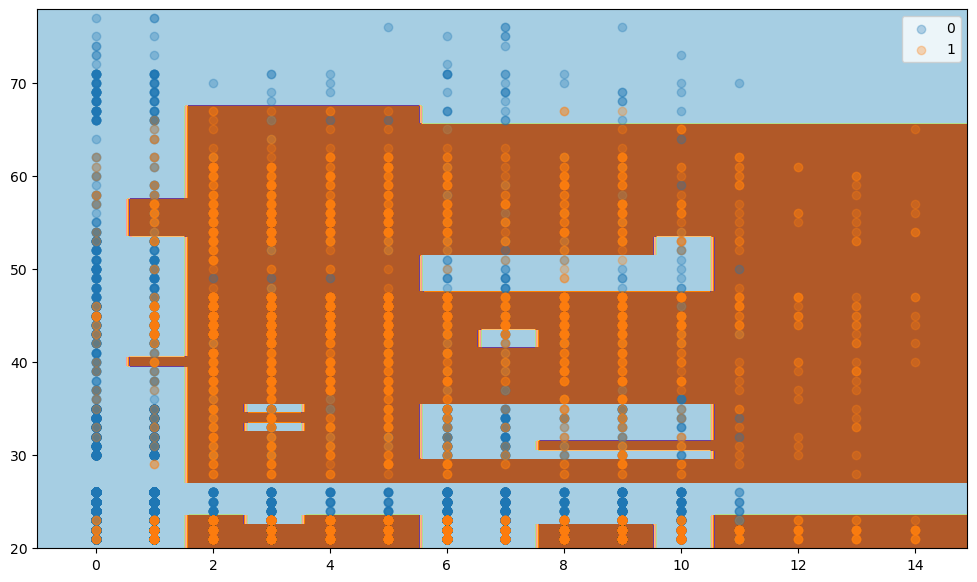

In [30]:
plot_classification_surface(X_plot=np.array(X_train), y_plot=y_train, trained_model=model_tree_best)

              precision    recall  f1-score   support

           0       0.92      0.91      0.91      3000
           1       0.82      0.84      0.83      1500

    accuracy                           0.89      4500
   macro avg       0.87      0.87      0.87      4500
weighted avg       0.89      0.89      0.89      4500



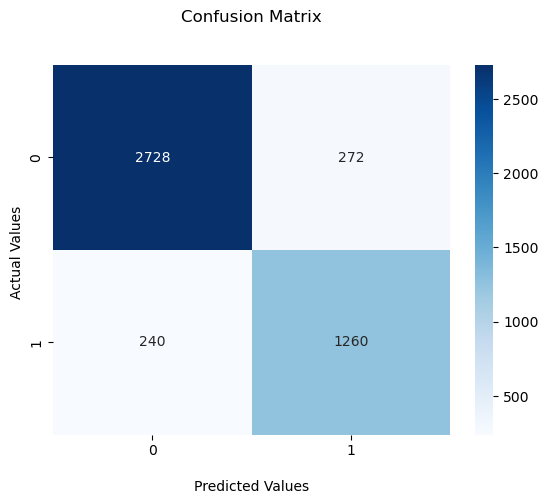

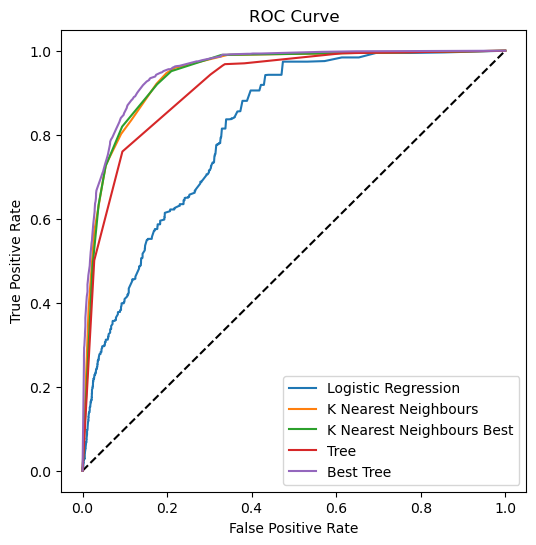

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,K Nearest Neighbours,0.808196,0.942804
2,K Nearest Neighbours Best,0.816611,0.941814
3,Tree,0.780021,0.915466
4,Best Tree,0.831135,0.953302


In [31]:
calculate_metrics(model_tree_best, 'Best Tree', X_test, y_test)

C:\Users\Urban\AppData\Local\Temp\ipykernel_16704\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


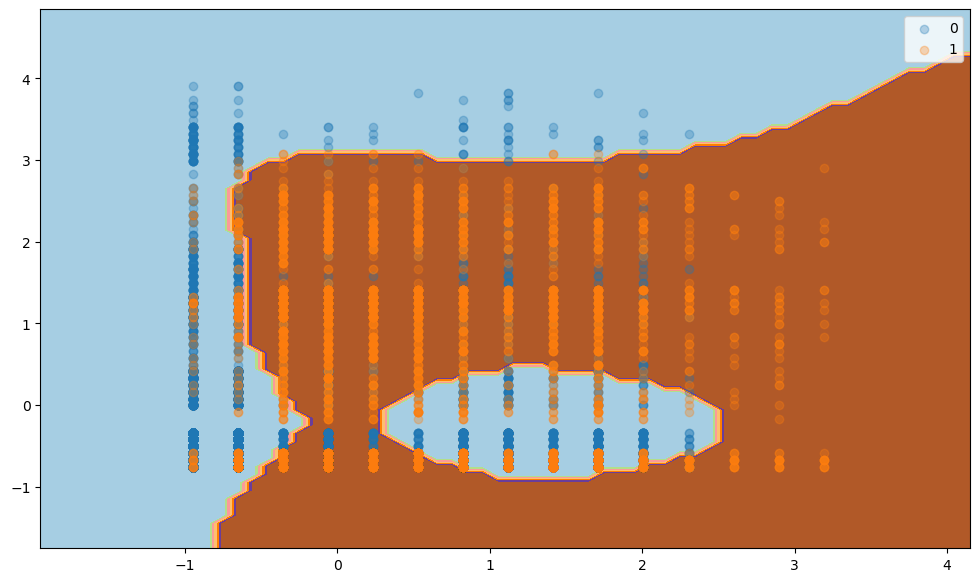

In [32]:
from sklearn.svm import SVC

model_svm = SVC(kernel='rbf', probability=True)
model_svm.fit(X_train_standardized, y_train)
plot_classification_surface(X_plot=X_train_standardized, y_plot=y_train, trained_model=model_svm)

              precision    recall  f1-score   support

           0       0.89      0.90      0.90      3000
           1       0.80      0.79      0.79      1500

    accuracy                           0.86      4500
   macro avg       0.85      0.84      0.85      4500
weighted avg       0.86      0.86      0.86      4500



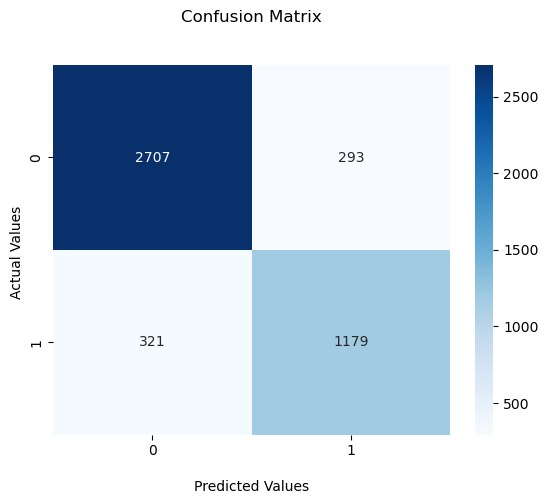

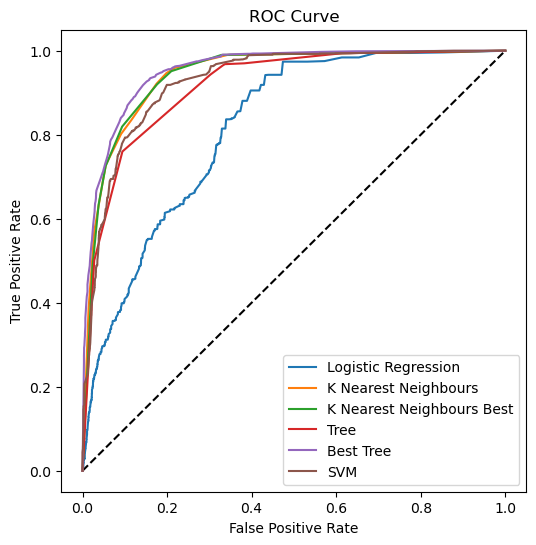

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,K Nearest Neighbours,0.808196,0.942804
2,K Nearest Neighbours Best,0.816611,0.941814
3,Tree,0.780021,0.915466
4,Best Tree,0.831135,0.953302
5,SVM,0.793405,0.927973


In [33]:
calculate_metrics(model_svm, 'SVM', X_test_standardized, y_test)

C:\Users\Urban\AppData\Local\Temp\ipykernel_16704\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


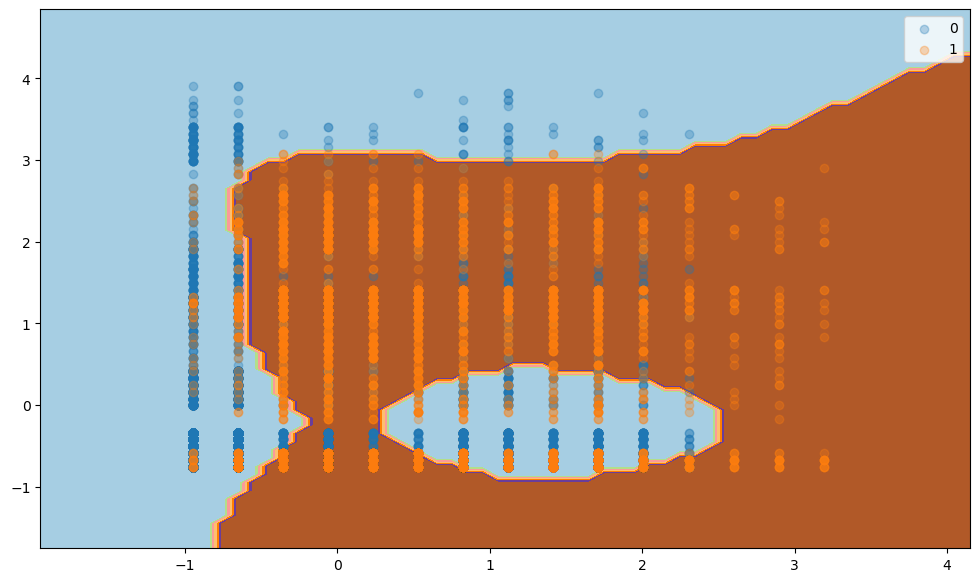

In [34]:
from sklearn.svm import SVC

model_svm_best = SVC(kernel='rbf', C=100, probability=True)
model_svm_best.fit(X_train_standardized, y_train)
plot_classification_surface(X_plot=X_train_standardized, y_plot=y_train, trained_model=model_svm)

              precision    recall  f1-score   support

           0       0.89      0.92      0.90      3000
           1       0.82      0.77      0.80      1500

    accuracy                           0.87      4500
   macro avg       0.85      0.84      0.85      4500
weighted avg       0.87      0.87      0.87      4500



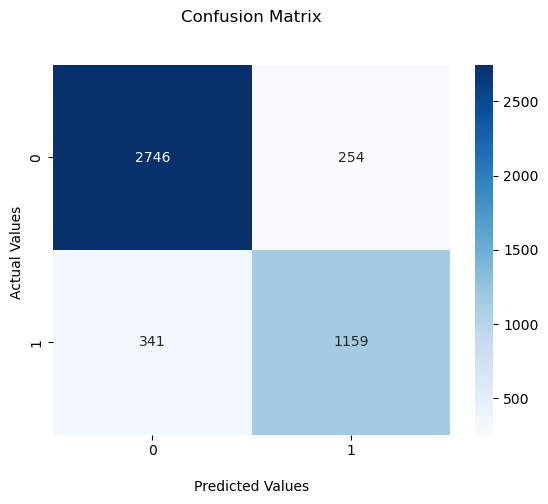

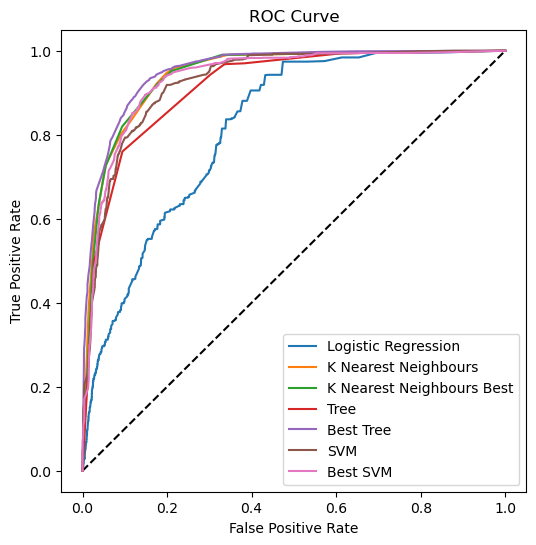

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,K Nearest Neighbours,0.808196,0.942804
2,K Nearest Neighbours Best,0.816611,0.941814
3,Tree,0.780021,0.915466
4,Best Tree,0.831135,0.953302
5,SVM,0.793405,0.927973
6,Best SVM,0.795743,0.934959


In [35]:
calculate_metrics(model_svm_best, 'Best SVM', X_test_standardized, y_test)

c:\Users\Urban\.conda\envs\kodilla-edu\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
C:\Users\Urban\AppData\Local\Temp\ipykernel_16704\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


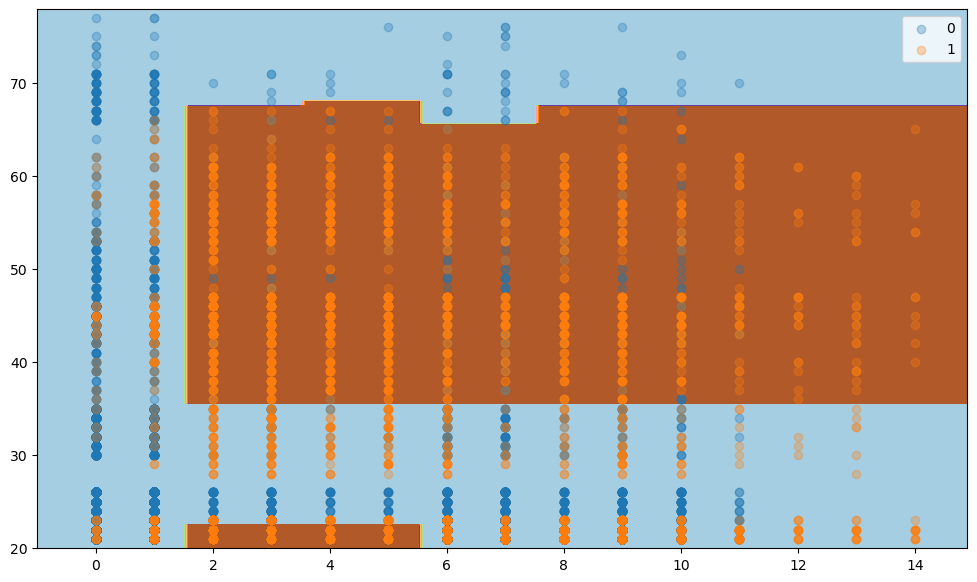

In [36]:
from sklearn.ensemble import RandomForestClassifier

model_forest = RandomForestClassifier(n_estimators=1000, max_depth=3, min_samples_leaf=int(X_train.shape[0]*0.001))
model_forest.fit(X_train, y_train)
plot_classification_surface(X_plot=np.array(X_train), y_plot=y_train, trained_model=model_forest)

              precision    recall  f1-score   support

           0       0.86      0.94      0.90      3000
           1       0.86      0.68      0.76      1500

    accuracy                           0.86      4500
   macro avg       0.86      0.81      0.83      4500
weighted avg       0.86      0.86      0.85      4500



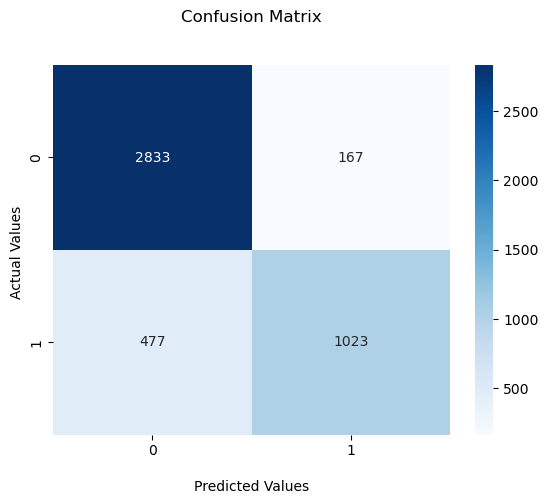

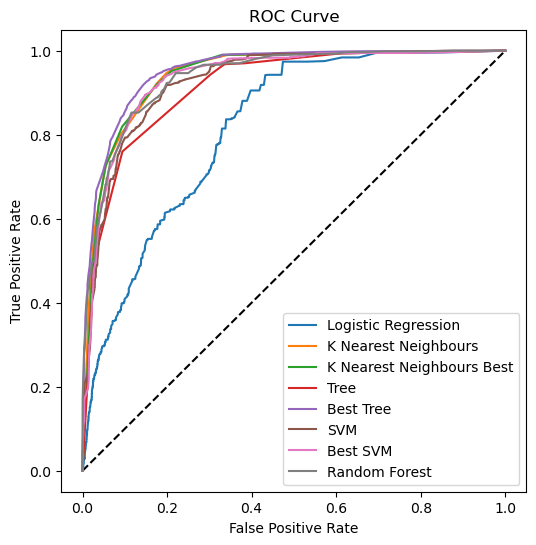

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,K Nearest Neighbours,0.808196,0.942804
2,K Nearest Neighbours Best,0.816611,0.941814
3,Tree,0.780021,0.915466
4,Best Tree,0.831135,0.953302
5,SVM,0.793405,0.927973
6,Best SVM,0.795743,0.934959
7,Random Forest,0.760595,0.938051


In [37]:
calculate_metrics(model_forest, 'Random Forest', X_test, y_test)

c:\Users\Urban\.conda\envs\kodilla-edu\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
C:\Users\Urban\AppData\Local\Temp\ipykernel_16704\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


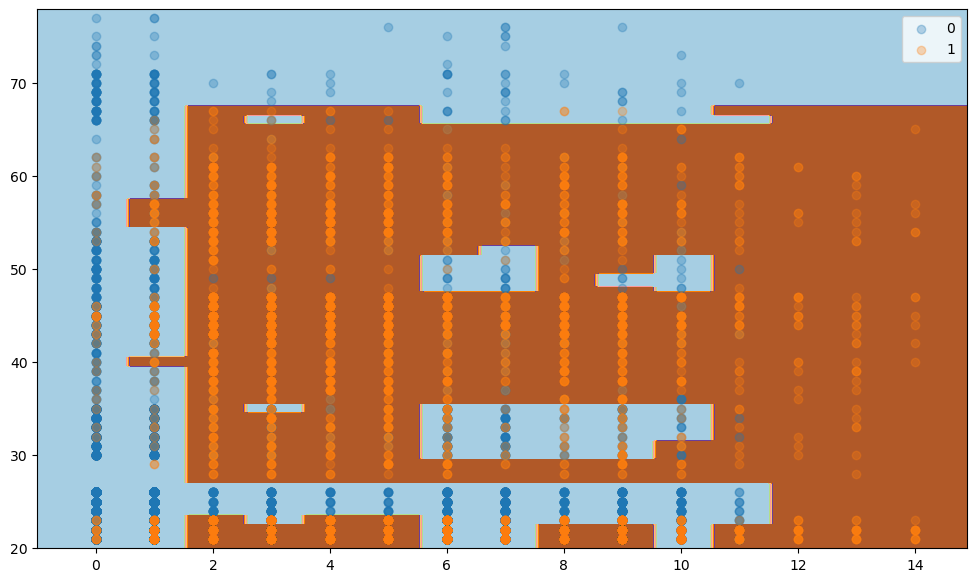

In [38]:
from sklearn.ensemble import RandomForestClassifier

model_forest_best = RandomForestClassifier(n_estimators=1000, max_depth=10, min_samples_leaf=5)
model_forest_best.fit(X_train, y_train)
plot_classification_surface(X_plot=np.array(X_train), y_plot=y_train, trained_model=model_forest_best)

              precision    recall  f1-score   support

           0       0.92      0.91      0.91      3000
           1       0.82      0.84      0.83      1500

    accuracy                           0.89      4500
   macro avg       0.87      0.87      0.87      4500
weighted avg       0.89      0.89      0.89      4500



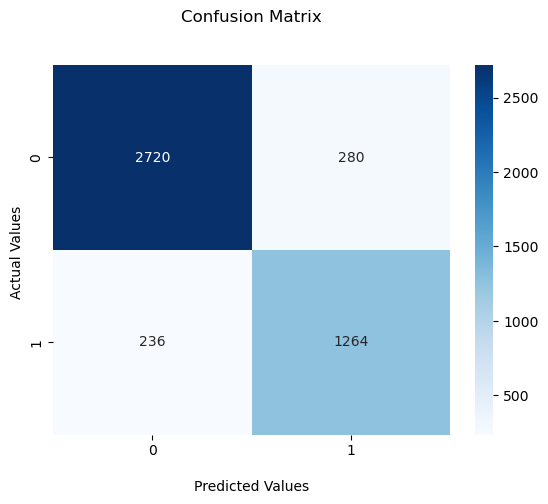

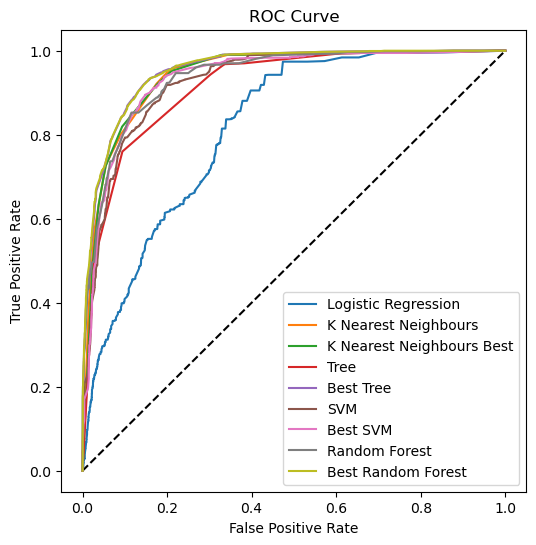

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,K Nearest Neighbours,0.808196,0.942804
2,K Nearest Neighbours Best,0.816611,0.941814
3,Tree,0.780021,0.915466
4,Best Tree,0.831135,0.953302
5,SVM,0.793405,0.927973
6,Best SVM,0.795743,0.934959
7,Random Forest,0.760595,0.938051
8,Best Random Forest,0.830486,0.954289


In [39]:
calculate_metrics(model_forest_best, 'Best Random Forest', X_test, y_test)

c:\Users\Urban\.conda\envs\kodilla-edu\lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
c:\Users\Urban\.conda\envs\kodilla-edu\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\Urban\AppData\Local\Temp\ipykernel_16704\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


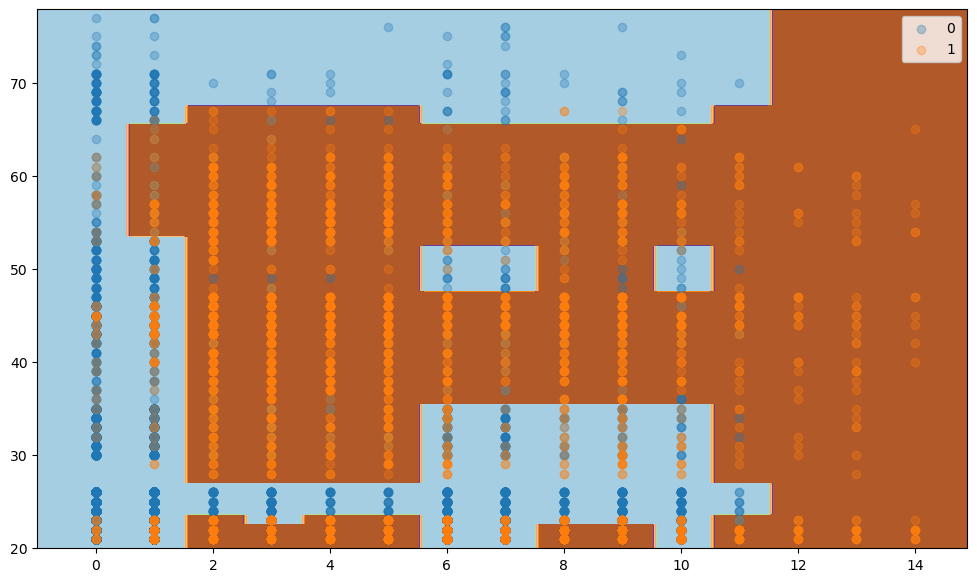

In [41]:
from sklearn.ensemble import AdaBoostClassifier

model_adaboost = AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=1), n_estimators=50)
model_adaboost.fit(X_train, y_train)
plot_classification_surface(X_plot=np.array(X_train), y_plot=y_train, trained_model=model_adaboost)

              precision    recall  f1-score   support

           0       0.92      0.91      0.91      3000
           1       0.82      0.84      0.83      1500

    accuracy                           0.88      4500
   macro avg       0.87      0.87      0.87      4500
weighted avg       0.89      0.88      0.88      4500



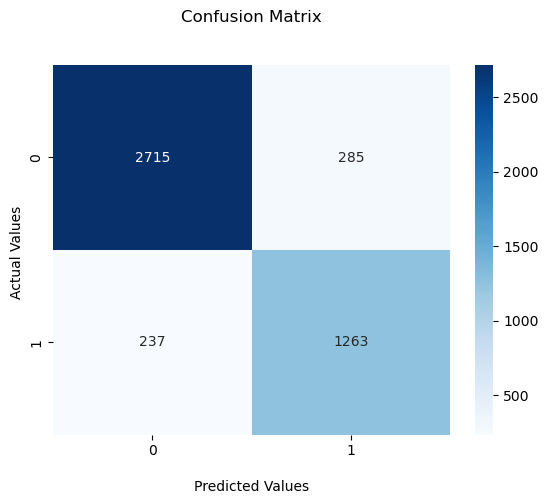

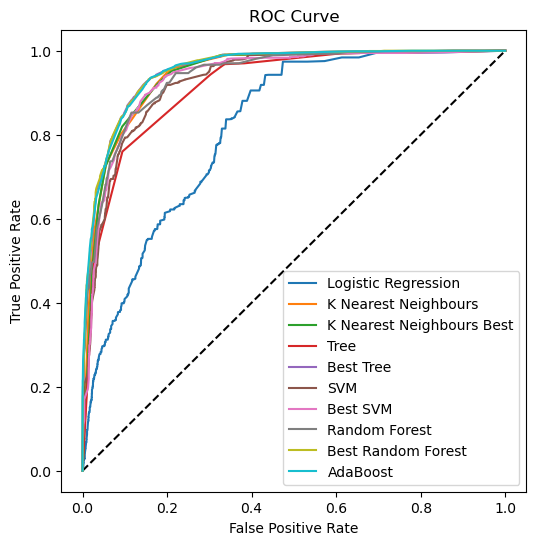

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,K Nearest Neighbours,0.808196,0.942804
2,K Nearest Neighbours Best,0.816611,0.941814
3,Tree,0.780021,0.915466
4,Best Tree,0.831135,0.953302
5,SVM,0.793405,0.927973
6,Best SVM,0.795743,0.934959
7,Random Forest,0.760595,0.938051
8,Best Random Forest,0.830486,0.954289
9,AdaBoost,0.828740,0.953601


In [42]:
calculate_metrics(model_adaboost, 'AdaBoost', X_test, y_test)

c:\Users\Urban\.conda\envs\kodilla-edu\lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
c:\Users\Urban\.conda\envs\kodilla-edu\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\Urban\AppData\Local\Temp\ipykernel_16704\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


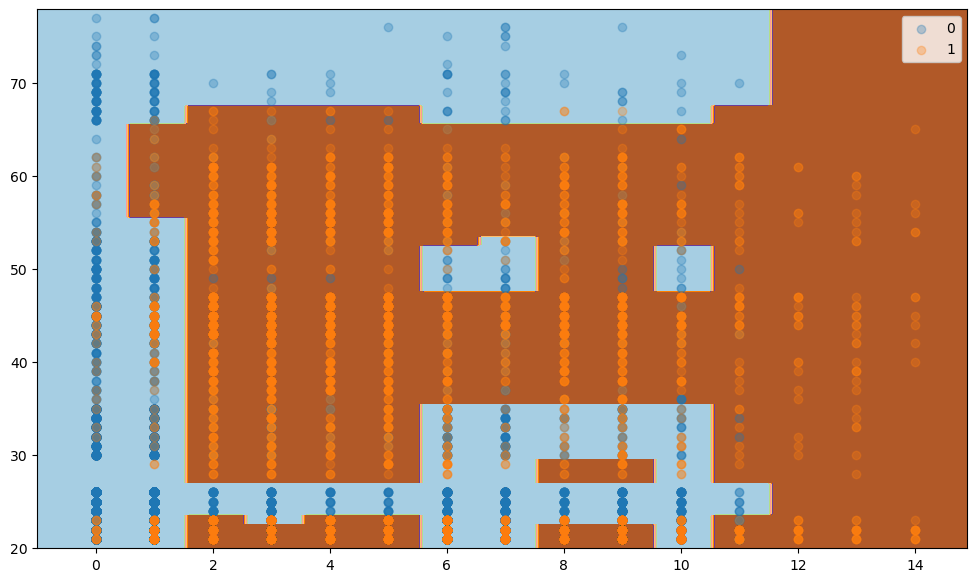

              precision    recall  f1-score   support

           0       0.92      0.91      0.91      3000
           1       0.82      0.84      0.83      1500

    accuracy                           0.89      4500
   macro avg       0.87      0.88      0.87      4500
weighted avg       0.89      0.89      0.89      4500



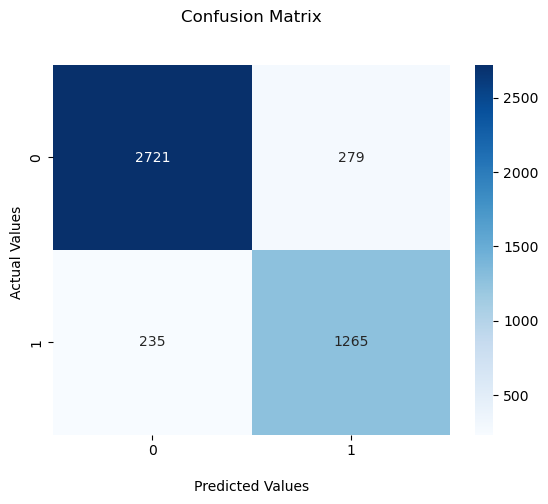

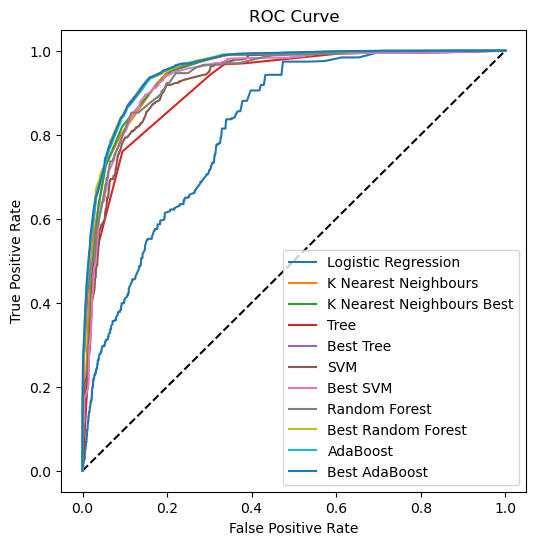

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,K Nearest Neighbours,0.808196,0.942804
2,K Nearest Neighbours Best,0.816611,0.941814
3,Tree,0.780021,0.915466
4,Best Tree,0.831135,0.953302
5,SVM,0.793405,0.927973
6,Best SVM,0.795743,0.934959
7,Random Forest,0.760595,0.938051
8,Best Random Forest,0.830486,0.954289
9,AdaBoost,0.828740,0.953601


In [43]:
from sklearn.ensemble import AdaBoostClassifier

model_adaboost_best = AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=1), n_estimators=100, learning_rate=1, algorithm='SAMME.R')
model_adaboost_best.fit(X_train, y_train)
plot_classification_surface(X_plot=np.array(X_train), y_plot=y_train, trained_model=model_adaboost_best)

calculate_metrics(model_adaboost_best, 'Best AdaBoost', X_test, y_test)

c:\Users\Urban\.conda\envs\kodilla-edu\lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
c:\Users\Urban\.conda\envs\kodilla-edu\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
c:\Users\Urban\.conda\envs\kodilla-edu\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
c:\Users\Urban\.conda\envs\kodilla-edu\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\Urban\AppData\Local\Temp\ipykernel_16704\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


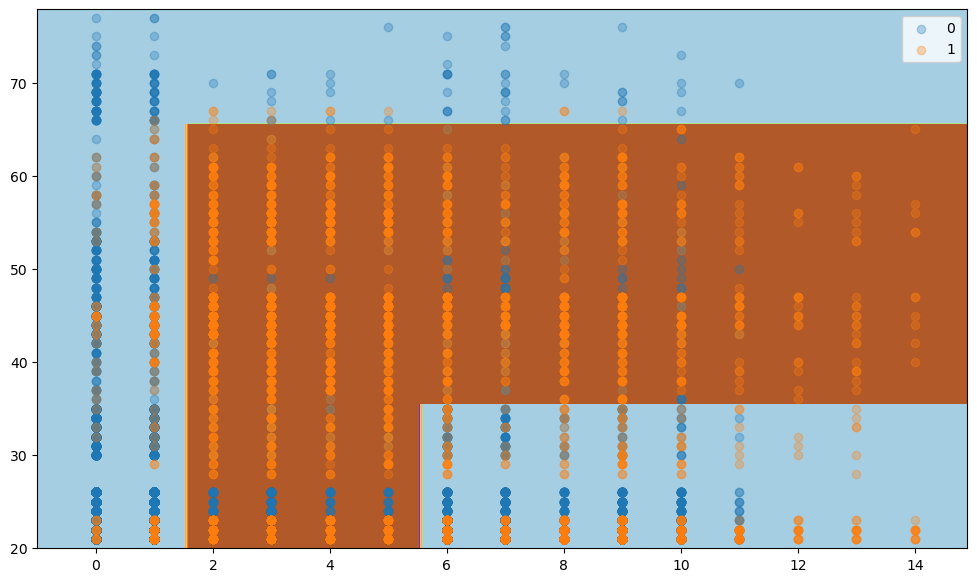

In [44]:
from sklearn.ensemble import VotingClassifier

model_voting = VotingClassifier(estimators=[('Tree', model_tree),
                                            ('Random Forest', model_forest),
                                            ('AdaBoost', model_adaboost)],
                                voting='soft')

model_voting.fit(X_train, y_train)
plot_classification_surface(X_plot=np.array(X_train), y_plot=y_train, trained_model=model_voting)

              precision    recall  f1-score   support

           0       0.88      0.91      0.89      3000
           1       0.80      0.76      0.78      1500

    accuracy                           0.86      4500
   macro avg       0.84      0.83      0.84      4500
weighted avg       0.86      0.86      0.86      4500



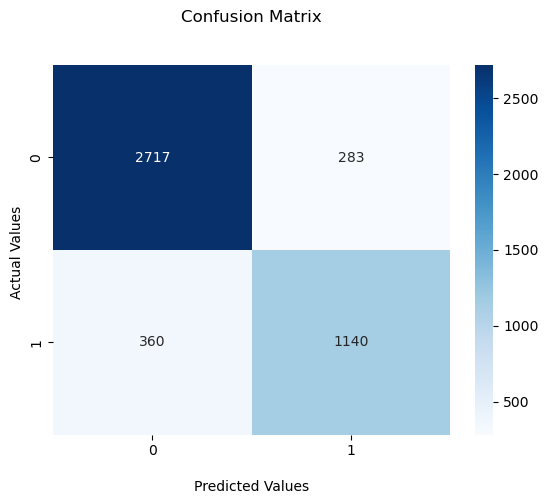

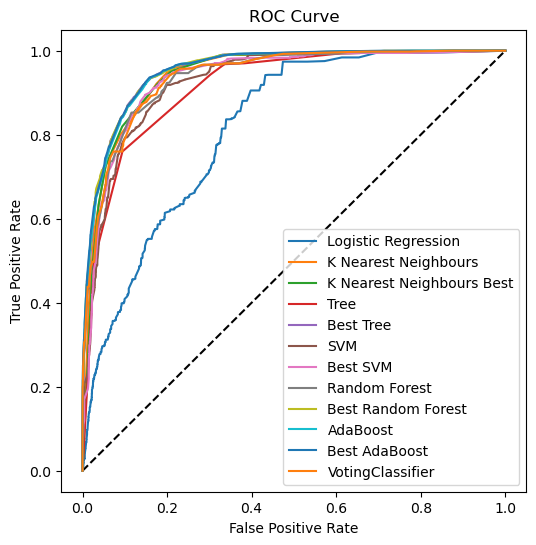

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,K Nearest Neighbours,0.808196,0.942804
2,K Nearest Neighbours Best,0.816611,0.941814
3,Tree,0.780021,0.915466
4,Best Tree,0.831135,0.953302
5,SVM,0.793405,0.927973
6,Best SVM,0.795743,0.934959
7,Random Forest,0.760595,0.938051
8,Best Random Forest,0.830486,0.954289
9,AdaBoost,0.828740,0.953601


In [45]:
calculate_metrics(model_voting, 'VotingClassifier', X_test, y_test)


c:\Users\Urban\.conda\envs\kodilla-edu\lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
c:\Users\Urban\.conda\envs\kodilla-edu\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
c:\Users\Urban\.conda\envs\kodilla-edu\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
c:\Users\Urban\.conda\envs\kodilla-edu\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
C:\Users\Urban\AppData\Local\Temp\ipykernel_16704\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


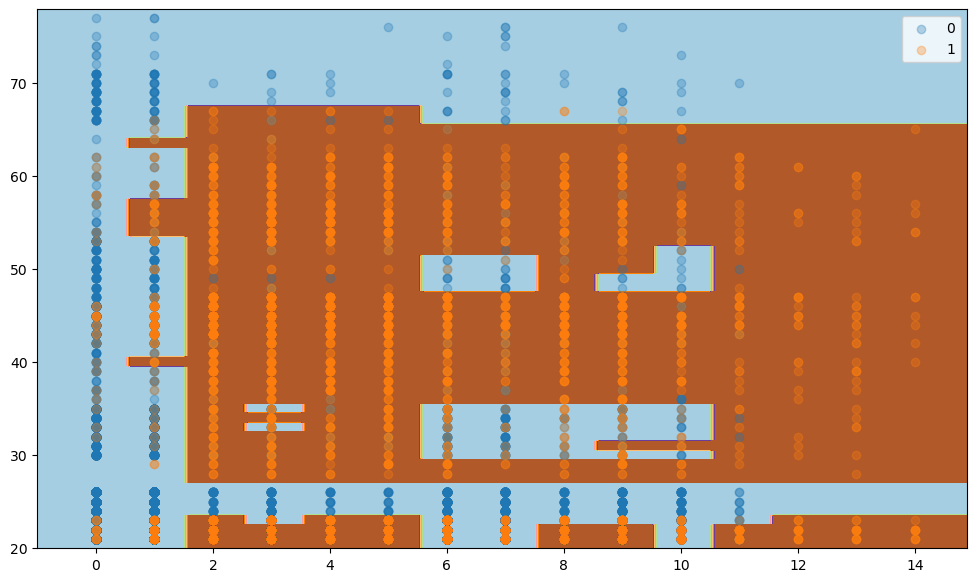

In [46]:
from sklearn.ensemble import VotingClassifier

model_voting_best = VotingClassifier(estimators=[('Tree', model_tree_best),
                                            ('Random Forest', model_forest_best),
                                            ('AdaBoost', model_adaboost_best)],
                                voting='soft')

model_voting_best.fit(X_train, y_train)
plot_classification_surface(X_plot=np.array(X_train), y_plot=y_train, trained_model=model_voting_best)


              precision    recall  f1-score   support

           0       0.92      0.91      0.91      3000
           1       0.82      0.84      0.83      1500

    accuracy                           0.88      4500
   macro avg       0.87      0.87      0.87      4500
weighted avg       0.89      0.88      0.89      4500



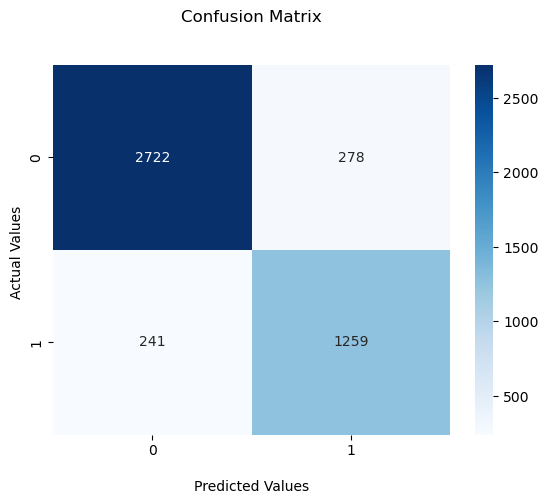

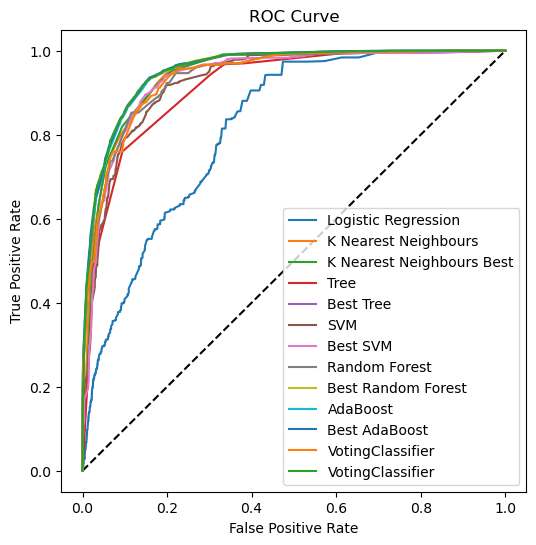

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,K Nearest Neighbours,0.808196,0.942804
2,K Nearest Neighbours Best,0.816611,0.941814
3,Tree,0.780021,0.915466
4,Best Tree,0.831135,0.953302
5,SVM,0.793405,0.927973
6,Best SVM,0.795743,0.934959
7,Random Forest,0.760595,0.938051
8,Best Random Forest,0.830486,0.954289
9,AdaBoost,0.828740,0.953601


In [47]:
calculate_metrics(model_voting_best, 'Best VotingClassifier', X_test, y_test)

c:\Users\Urban\.conda\envs\kodilla-edu\lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
C:\Users\Urban\AppData\Local\Temp\ipykernel_16704\3056952232.py:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


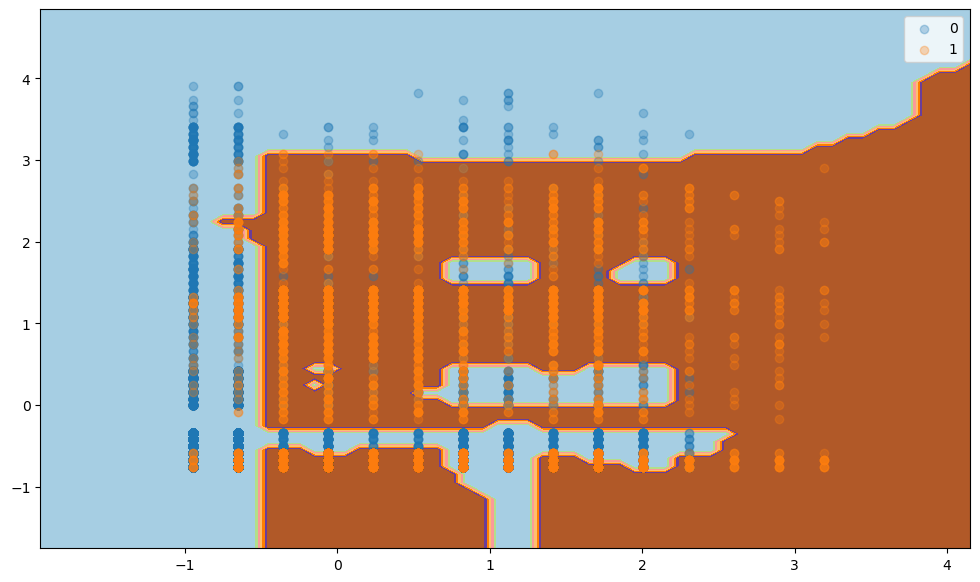

              precision    recall  f1-score   support

           0       0.92      0.91      0.91      3000
           1       0.82      0.83      0.83      1500

    accuracy                           0.88      4500
   macro avg       0.87      0.87      0.87      4500
weighted avg       0.89      0.88      0.88      4500



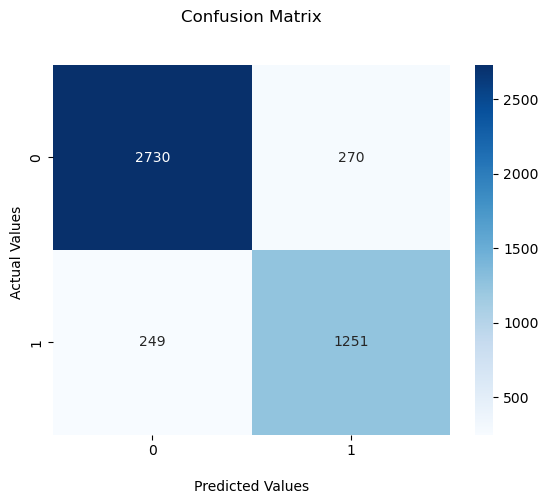

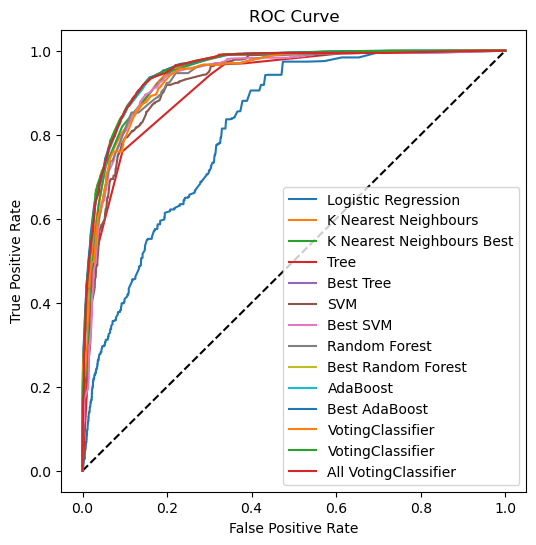

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,K Nearest Neighbours,0.808196,0.942804
2,K Nearest Neighbours Best,0.816611,0.941814
3,Tree,0.780021,0.915466
4,Best Tree,0.831135,0.953302
5,SVM,0.793405,0.927973
6,Best SVM,0.795743,0.934959
7,Random Forest,0.760595,0.938051
8,Best Random Forest,0.830486,0.954289
9,AdaBoost,0.828740,0.953601


In [48]:
from sklearn.ensemble import VotingClassifier

model_voting_all = VotingClassifier(estimators=[('Best Tree', model_tree_best),
                                            ('Best Random Forest', model_forest_best),
                                            ('Best AdaBoost', model_adaboost_best),
                                            ('Best SVM', model_svm_best),
                                            ('KNN Best', model_knn_best)],
                                voting='soft')

model_voting_all.fit(X_train_standardized, y_train)
plot_classification_surface(X_plot=np.array(X_train_standardized), y_plot=y_train, trained_model=model_voting_all)

calculate_metrics(model_voting_all, 'All VotingClassifier', X_test_standardized, y_test)

In [49]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=0, stratify=y)

In [50]:
from sklearn.model_selection import GridSearchCV

random_forest = RandomForestClassifier(n_estimators=1000, n_jobs=-1)
params_rf = {'max_depth': [3, 5, 10, 20],
             'min_samples_leaf': [3, 5, 10, 15]}
rf_gridsearch = GridSearchCV(random_forest,
                             params_rf,
                             scoring='f1_macro',
                             cv=5,
                             verbose=10, n_jobs=-1)
rf_gridsearch.fit(X_train, y_train)
print('\nBest hyperparameter:', rf_gridsearch.best_params_)
rf_model_v2 = rf_gridsearch.best_estimator_

Fitting 5 folds for each of 16 candidates, totalling 80 fits

Best hyperparameter: {'max_depth': 20, 'min_samples_leaf': 3}


              precision    recall  f1-score   support

           0       0.95      0.96      0.95      3000
           1       0.92      0.90      0.91      1500

    accuracy                           0.94      4500
   macro avg       0.93      0.93      0.93      4500
weighted avg       0.94      0.94      0.94      4500



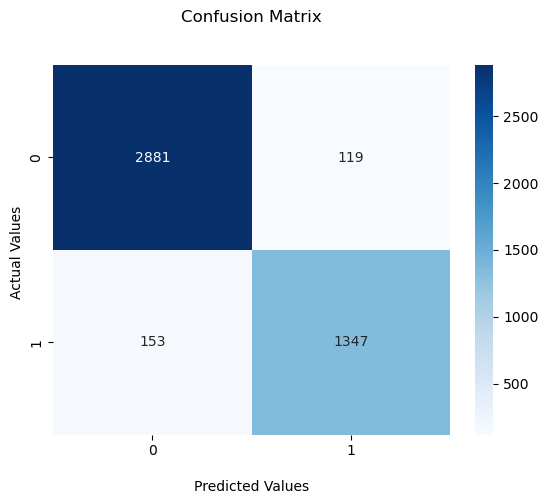

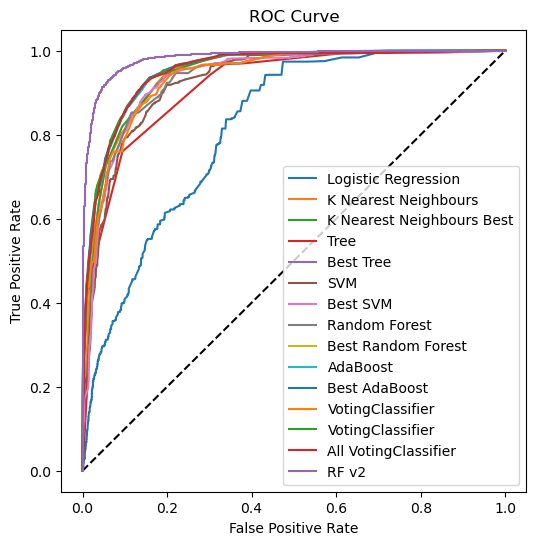

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,K Nearest Neighbours,0.808196,0.942804
2,K Nearest Neighbours Best,0.816611,0.941814
3,Tree,0.780021,0.915466
4,Best Tree,0.831135,0.953302
5,SVM,0.793405,0.927973
6,Best SVM,0.795743,0.934959
7,Random Forest,0.760595,0.938051
8,Best Random Forest,0.830486,0.954289
9,AdaBoost,0.828740,0.953601


In [51]:
calculate_metrics(rf_model_v2, 'RF v2', X_test, y_test)

In [52]:
ada_boost = AdaBoostClassifier()

# Definiujemy siatkę parametrów do przeszukania
params_ada = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1]
}

# Inicjalizujemy GridSearchCV
ada_gridsearch = GridSearchCV(
    ada_boost,
    params_ada,
    scoring='f1_macro',  # lub inna miara, np. accuracy, precision, recall
    cv=5,
    verbose=10,
    n_jobs=-1
)

# Trenujemy wyszukiwanie najlepszych hiperparametrów
ada_gridsearch.fit(X_train, y_train)

# Wyświetlamy najlepszy zestaw parametrów
print('\nBest hyperparameter:', ada_gridsearch.best_params_)

# Tworzymy model z najlepszymi parametrami
ada_model_v2 = ada_gridsearch.best_estimator_

Fitting 5 folds for each of 9 candidates, totalling 45 fits


c:\Users\Urban\.conda\envs\kodilla-edu\lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



Best hyperparameter: {'learning_rate': 1, 'n_estimators': 200}


              precision    recall  f1-score   support

           0       0.97      0.97      0.97      3000
           1       0.94      0.93      0.94      1500

    accuracy                           0.96      4500
   macro avg       0.95      0.95      0.95      4500
weighted avg       0.96      0.96      0.96      4500



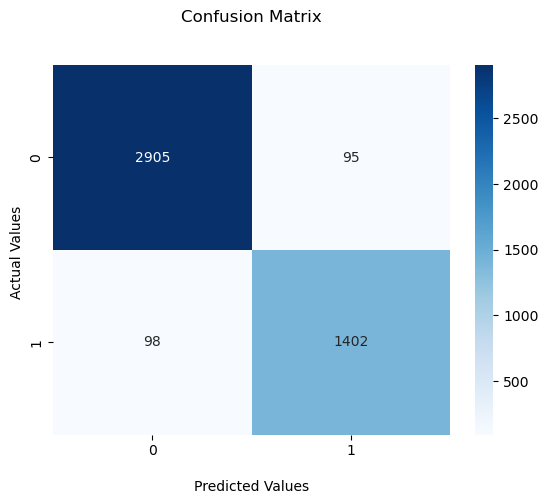

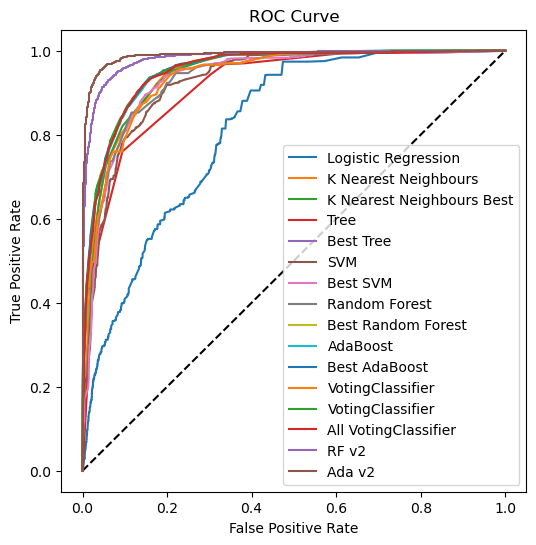

,Model,F1_score,AUC
0,Logistic Regression,0.580928,0.816493
1,K Nearest Neighbours,0.808196,0.942804
2,K Nearest Neighbours Best,0.816611,0.941814
3,Tree,0.780021,0.915466
4,Best Tree,0.831135,0.953302
5,SVM,0.793405,0.927973
6,Best SVM,0.795743,0.934959
7,Random Forest,0.760595,0.938051
8,Best Random Forest,0.830486,0.954289
9,AdaBoost,0.828740,0.953601


In [53]:
calculate_metrics(ada_model_v2, 'Ada v2', X_test, y_test)